# Latent Space as a similarity index

In [1]:
from plots import plot_recons

import scipy as sp

from plots import plot_vox, plot_dots, plot_compare_recons

import numpy as np
from keras.utils import to_categorical


from data import load_data, load_custom_model

(x_train, y_train), (x_test, y_test), target_names = load_data('./ModelNet40/')
y_test = to_categorical(y_test)
y_train = to_categorical(y_train)

def accuracy(y_pred, y_test):
    return np.sum(np.argmax(y_pred, 1) == np.argmax(y_test, 1))/y_test.shape[0]

eval_model = load_custom_model('./models/eval_model_net40_acc_08047.hdf5')

manipulate_model = load_custom_model('./models/manipulate_model_net40_acc_08047.hdf5')

/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/matplotlib/__init__.py:962: UserWarning: Duplicate key in file "/home/ubuntu/.config/matplotlib/matplotlibrc", line #2
  (fname, cnt))
/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/matplotlib/__init__.py:962: UserWarning: Duplicate key in file "/home/ubuntu/.config/matplotlib/matplotlibrc", line #3
  (fname, cnt))
/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


Instructions for updating:
dim is deprecated, use axis instead


/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/keras/models.py:255: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [2]:
from keras.models import Model
%matplotlib inline


latent_mask = Model(eval_model.input, eval_model.layers[-3].output)
corpus_mask = latent_mask.predict(x_test)
# latent_capsule = Model(eval_model.input, eval_model.layers[-4].output)
# corpus_capsule = latent_capsule.predict(x_test)


# Let's take a look at some samples and see how they're similar

In [3]:
def compare(num_1, num_2):
    # plot_dots(x_test[num_1].reshape(30, 30, 30)*.99, dotsize_scale=10, dotsize_offset=0)
    # plot_dots(x_test[num_2].reshape(30, 30, 30)*.99, dotsize_scale=10, dotsize_offset=0)
    plot_vox(x_test[num_1], x_test[num_2])

    print('length', sp.spatial.distance.cosine(corpus_length[num_1], corpus_length[num_2]))
    # print('capsule', sp.spatial.distance.cosine(corpus_capsule[num_1], corpus_capsule[num_2]))
    print('mask', sp.spatial.distance.cosine(corpus_mask[num_1], corpus_mask[num_2]))

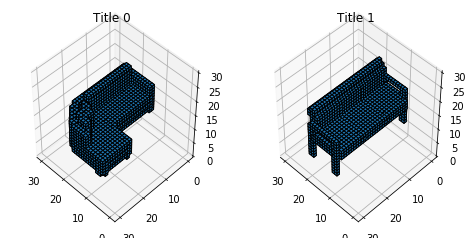

Left: sofa		Right: sofa
Cosine Similarity via Mask Layer: 0.9138912558555603


In [4]:
num1 = 100
num2 = 101
plot_vox(x_test[num1], x_test[num2])
a = corpus_mask[num1]
b = corpus_mask[num2]
print('Left: {}\t\tRight: {}'.format(target_names[np.argmax(y_test[num1])], target_names[np.argmax(y_test[num2])]))
print('Cosine Similarity via Mask Layer: {}'.format(1 - sp.spatial.distance.cosine(a, b)))

/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/matplotlib/collections.py:853: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


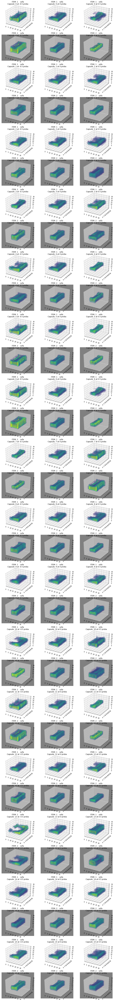

In [5]:
plot_compare_recons(x_test[num1], x_test[num2], y_test[num1], y_test[num2],
                    dim_sub_capsule=16, manipulate_model=manipulate_model,
                    proba_range=[-0.5, 0, 0.5], dotsize_scale=10, dotsize_offset=1,
                    target_names=target_names)

In [29]:
thing = np.zeros((y_test.shape[0], 40))

thing[:, target_names.index('stool')] = 1

In [30]:
thing.shape

(2468, 40)

In [44]:
x_test[np.argmax(y_test, axis=1) == np.argmax(thing, axis=1)].shape

(20, 30, 30, 30, 1)

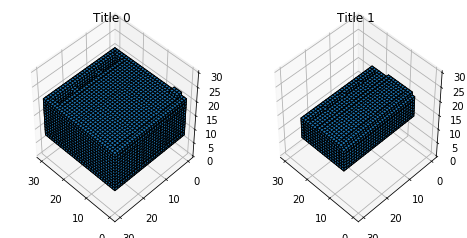

Left: glass_box		Right: glass_box
Cosine Similarity via Mask Layer: 0.36631447076797485


In [47]:
num1 = 20
num2 = 45
plot_vox(x_test[num1], x_test[num2])
a = corpus_mask[num1]
b = corpus_mask[num2]
print('Left: {}\t\tRight: {}'.format(target_names[np.argmax(y_test[num1])], target_names[np.argmax(y_test[num2])]))
print('Cosine Similarity via Mask Layer: {}'.format(1 - sp.spatial.distance.cosine(a, b)))

/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/matplotlib/collections.py:853: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


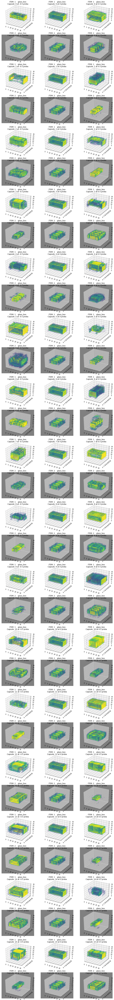

In [48]:
plot_compare_recons(x_test[num1], x_test[num2], y_test[num1], y_test[num2],
                    dim_sub_capsule=16, manipulate_model=manipulate_model,
                    proba_range=[-0.5, 0, 0.5], dotsize_scale=10, dotsize_offset=1,
                    target_names=target_names)

/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/matplotlib/collections.py:853: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


KeyboardInterrupt: 

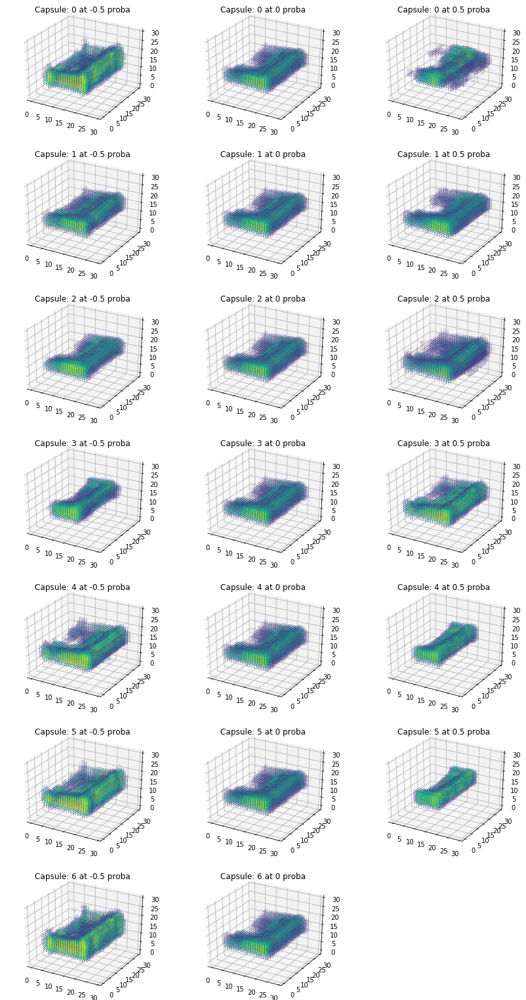

In [96]:
plot_recons(x_test[num1], y_test[num1], 16, manipulate_model,
            proba_range=[-0.5, 0, 0.5], dotsize_scale=10,
            dotsize_offset=1)

In [ ]:
plot_recons(x_test[num2], y_test[num2], 16, manipulate_model,
            proba_range=[-0.5, 0, 0.5], dotsize_scale=10,
            dotsize_offset=1)

In [10]:
y_test[0]

array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0.])

In [9]:
y_test[100]

array([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0.])

In [11]:
y_test[200]

array([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0.])

In [12]:
y_test[300]

array([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0.])

In [12]:
y_test[400]

array([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0.])

In [1]:
import vispy

In [2]:
vispy.test()

Skipping example test: Cannot test examples unless in vispy git directory
Running line endings check... 
Passed

Skipping flake8 test, flake8 not installed
Passed

Testing succeeded (0 failed, ['pyqt4', 'pyqt5', 'pyside', 'pyglet', 'glfw', 'sdl2', 'wx', 'egl', 'osmesa', 'ipynb_webgl', '_test', 'nobackend', 'examples'] skipped) in 0.037 seconds


In [14]:
for i in [0, 100, 200, 300]:
    for j in [5, 105, 205, 305]:
        compare(i, j)

KeyboardInterrupt: 

In [3]:
import vispy.app
vispy.app.use_app('pyqt5')
from vispy.plot import Fig


/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/matplotlib/__init__.py:962: UserWarning: Duplicate key in file "/home/ubuntu/.config/matplotlib/matplotlibrc", line #2
  (fname, cnt))
/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/matplotlib/__init__.py:962: UserWarning: Duplicate key in file "/home/ubuntu/.config/matplotlib/matplotlibrc", line #3
  (fname, cnt))


In [ ]:
fig = Fig()

# ax_left = fig[0, 0]
# ax_right = fig[0, 1]
# data = np.random.randn(2, 10)
# ax_left.plot(data)
# ax_right.histogram(data[1])

# Let's take a look at HOW the model is defining them as similar